In [2]:
#  -------------------------------------------
### zuno_v4 + xgboost
###  INPUT ###
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.metrics import mean_squared_error, r2_score

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', 1000)
input_data = pd.read_csv('2023_smartFarm_AI_hackathon_dataset.csv')

def preprocessing(input_data):
    input_data = input_data.sort_values(["frmDist","date"])
    input_data["date"] = pd.to_datetime(input_data["date"], format='%Y%m%d')

    input_data = input_data.copy()
    input_data["frmYearWeek"] = input_data.date.dt.strftime('%Y-%W')
    input_data["frmYear"] = input_data.date.dt.strftime('%Y')
    input_data["frmWeek"] = input_data.date.dt.strftime('%W').astype(int)
    input_data = input_data.sort_values("frmYearWeek")


    dd = input_data.groupby(['frmDist', 'frmYearWeek']).agg(
        Y=('outtrn_cumsum', 'max'),
        Sun_Min=('acSlrdQy', 'min'), # 누적일사량
        Sun_Max=('acSlrdQy', 'max'),
        Sun_Mean=('acSlrdQy', 'mean'),
        INTP_Min=('inTp', 'min'), # 내부온도
        INTP_Max=('inTp', 'max'),
        INTP_Mean=('inTp', 'mean'),
        OUTTP_Min=('outTp', 'min'), # 외부온도
        OUTTP_Max=('outTp', 'max'),
        OUTTP_Mean=('outTp', 'mean'),
        minINHD=('inHd', 'min'), # 내부습도
        maxINHD=('inHd', 'max'), 
        meanINHD=('inHd', 'mean'), 
        minCO2=('inCo2', 'min'), # 내부CO2
        maxCO2=('inCo2', 'max'), 
        meanCO2=('inCo2', 'mean'),
        minlC=('lefCunt', 'min'),
        maxlC=('lefCunt', 'max'), # 
        meanlC=('lefCunt', 'mean'),
        minLT=('lefLt', 'min'),
        maxLT=('lefLt', 'max'),
        meanLT=('lefLt', 'mean'),
        minBT=('lefBt', 'min'),
        maxBT=('lefBt', 'max'),
        meanBT=('lefBt', 'mean'),
        meanFrmAr=('frmAr', 'mean'),
        meanFRM=('frmDov', 'mean')
    ).reset_index()
    dd['meanFRMMul'] = dd['meanFrmAr'] * dd['meanFRM']
    dd_unique = dd.groupby('frmDist').agg(nn=('frmYearWeek', 'size')).reset_index()
    dd_unique_list = dd_unique.query('nn >= 16')
    # Filtering based on dd_unique_list
    dd = dd[dd['frmDist'].isin(dd_unique_list['frmDist'])]

    res = []
    for frmDist in dd['frmDist'].unique():
        tmp = dd[dd['frmDist'] == frmDist]
        arr = tmp['Y'].values
        start = (arr != 0).argmax()
        real = tmp.iloc[(start - 8) : (start + 8)]

        arr = real['Y'].values
        for j in range(9, 15):
            if arr[j] == 0:
                arr[j] = (arr[j - 1] + arr[j + 1]) / 2
        Y = arr[-1]
        X = real.iloc[15, 3:].values
        dataset = pd.DataFrame({'Y': [Y], 'X1':[X[0]], 'X2': [X[1]], 'X3': [X[2]], 'X4': [X[3]], 'X5': [X[4]], 'X6': [X[5]], 'X7': [X[6]],
                                'X8': [X[7]], 'X9': [X[8]], 'X10': [X[9]], 'X11': [X[10]], 'X12': [X[11]], 'X13': [X[12]], 'X14': [X[13]],
                                'X15': [X[14]],'X16': [X[15]],'X17': [X[16]],'X18': [X[17]], 'X19': [X[18]], 'X20': [X[19]], 'X21': [X[20]],
                                'X22': [X[21]],'X23': [X[22]],'X24': [X[23]],'X25': [X[24]], 'X26': [X[25]], 'X27': [X[26]],
                                'Y1' : [arr[8]], 'Y2' : [arr[9]], 'Y3' : [arr[10]], 'Y4' : [arr[11]], 'Y5' : [arr[12]], 'Y6' : [arr[13]], 'Y7' : [arr[14]]})
        res.append(dataset)

    result = pd.concat(res, ignore_index=True)

    # Filtering based on 'Y' column
    result = result[result['Y'] >= 10]
    
    return result


# ... (Data preprocessing code here)

input_data = preprocessing(input_data)
# Split the data into training and testing sets
X = input_data[input_data.drop(columns=['Y']).columns]
Y = input_data[['Y']]

# 
# X_train, X_test, y_train, y_test = train_test_split(
#     X, Y, test_size=0.2, random_state=42
# )

# XGBoost 모델 생성
model = xgb.XGBRegressor(n_estimators=1000, random_state=0)

model.fit(X, Y.values.ravel())
y_pred = model.predict(X)

# RMSE 계산 함수
def calculate_rmse(targets, predictions):
    return np.sqrt(mean_squared_error(targets, predictions))

# R-squared 계산 함수
def calculate_R2_score(y_test, y_pred):
    return r2_score(y_test, y_pred)

# RMSE 및 R-squared 계산
rmse = calculate_rmse(Y, y_pred)
r2score = calculate_R2_score(Y, y_pred)

# 결과 출력
print("RMSE:", rmse)
print("R2_score:", r2score)

RMSE: 0.004064397646481523
R2_score: 0.9999999999998502


In [160]:
import xgboost as xgb
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score

# XGBoost 모델 생성
model = xgb.XGBRegressor(n_estimators=1000, random_state=0)

# 모델을 데이터에 맞춰 학습시킵니다. X는 입력 특성 데이터, Y는 타겟 데이터여야 합니다.
model.fit(X, Y.values.ravel())

# 모델을 사용하여 예측을 수행합니다.
y_pred = model.predict(X)

### XGBoost rslt

RMSE: 0.004064397646481523
R2_score: 0.9999999999998502


In [162]:
# RMSE: 688.4974157651244
# R2_score: 0.9921441368663405

In [80]:
# 뒤에 30%만
rmse = calculate_rmse(Y[-63:], y_pred[-63:])
r2score = calculate_R2_score(Y[-63:], y_pred[-63:])

### OUTPUT ###
print("RMSE:", rmse)
print("R2_score:", r2score)

RMSE: 0.004379528786335193
R2_score: 0.9999999999998427


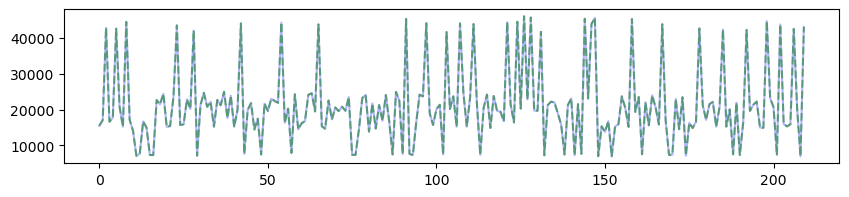

In [81]:
import matplotlib.pyplot as plt
plt.figure(figsize=[10,2])
plt.plot(np.array(Y), 'b', alpha=0.3)
plt.plot(y_pred, '--g', alpha=0.5)

### XGBoost hyperparameter

In [135]:
import xgboost as xgb
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV

# XGBoost 모델 생성
model = xgb.XGBRegressor(random_state=0)

# 튜닝할 하이퍼파라미터 그리드 정의
param_grid = {
    'n_estimators': [100, 500, 1000],  # 트리의 개수
    'learning_rate': [0.01, 0.1, 0.2],  # 학습률
    'max_depth': [3, 5, 7],  # 트리의 최대 깊이
    'min_child_weight': [1, 3, 5],  # 리프 노드의 최소 가중치 합
    'gamma': [0, 0.1, 0.2],  # 스플릿을 위한 최소 손실 감소
    'subsample': [0.8, 0.9, 1.0],  # 트리를 학습하는 데 사용되는 데이터 샘플의 비율
    'colsample_bytree': [0.8, 0.9, 1.0]  # 각 트리를 학습하는 데 사용되는 특성의 비율
}

# Grid Search를 사용하여 하이퍼파라미터 튜닝
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=0, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train.values.ravel())

# 최적의 하이퍼파라미터 조합 확인
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# 최적의 모델 가져오기
best_model = grid_search.best_estimator_

# 최적의 모델을 사용하여 예측 수행
y_pred = best_model.predict(X)

/home/jy/anaconda3/envs/smartfarm2/lib/python3.10/site-packages/xgboost/data.py:312: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
/home/jy/anaconda3/envs/smartfarm2/lib/python3.10/site-packages/xgboost/data.py:314: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif is_categorical_dtype(dtype) and enable_categorical:
/home/jy/anaconda3/envs/smartfarm2/lib/python3.10/site-packages/xgboost/data.py:345: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if is_categorical_dtype(dtype)
/home/jy/anaconda3/envs/smartfarm2/lib/python3.10/site-packages/xgboost/data.py:336: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) inste

Best Hyperparameters: {'colsample_bytree': 0.8, 'gamma': 0, 'learning_rate': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 1000, 'subsample': 0.8}


In [143]:
# hyperparameter
# best_params_xgb = {'colsample_bytree': 0.8,
#                  'gamma': 0,
#                  'learning_rate': 0.01,
#                  'max_depth': 5,
#                  'min_child_weight': 1,
#                  'n_estimators': 1000,
#                  'subsample': 0.9}

best_params_xgb2 = {'colsample_bytree': 0.8,
                 'gamma': 0,
                 'learning_rate': 0.01,
                 'max_depth': 3,
                 'min_child_weight': 1,
                 'n_estimators': 1000,
                 'subsample': 0.8}

# LGBMRegressor model
model = xgb.XGBRegressor(**best_params_xgb2)
# model.fit(X_train, y_train)
model.fit(X_train, y_train)

# predict
# y_pred = model.predict(X_test)
y_pred = model.predict(X_test)

In [120]:
best_params # grid search를 통해 얻은 best hyper parameter

{'colsample_bytree': 0.8,
 'gamma': 0,
 'learning_rate': 0.01,
 'max_depth': 5,
 'min_child_weight': 1,
 'n_estimators': 1000,
 'subsample': 0.9}

In [136]:
best_params # X_train, y_train으로 fit

{'colsample_bytree': 0.8,
 'gamma': 0,
 'learning_rate': 0.01,
 'max_depth': 3,
 'min_child_weight': 1,
 'n_estimators': 1000,
 'subsample': 0.8}

In [144]:
# Calculate RMSE between the predictions and actual 'y' values
def calculate_rmse(targets, predictions):
    from sklearn.metrics import mean_squared_error
    return np.sqrt(mean_squared_error(targets, predictions))



# Calculate r2_score between the predictions and actual 'y' values
def calculate_R2_score(y_test,y_pred):
    from sklearn.metrics import r2_score
    return r2_score(y_test, y_pred)

rmse = calculate_rmse(y_test, y_pred)
r2score = calculate_R2_score(y_test, y_pred)
# rmse = calculate_rmse(Y[-42:], y_pred[-42:])
# r2score = calculate_R2_score(Y[-42:], y_pred[-42:])

### OUTPUT ###
print("RMSE:", rmse)
print("R2_score:", r2score)

RMSE: 762.0330471203746
R2_score: 0.9917681628073954


In [92]:
import warnings
from catboost import CatBoostRegressor

# CatBoostRegressor 모델 생성
model = CatBoostRegressor(iterations=1000, random_state=0)  # 예시 하이퍼파라미터

# 모델을 데이터에 맞춰 학습시킵니다. X는 입력 특성 데이터, Y는 타겟 데이터여야 합니다.
model.fit(X, Y.values.ravel())

# 모델을 사용하여 예측을 수행합니다.
y_pred = model.predict(X)

Learning rate set to 0.031996
0:	learn: 10227.7352644	total: 1.03ms	remaining: 1.03s
1:	learn: 9946.0841340	total: 1.71ms	remaining: 853ms
2:	learn: 9701.9585298	total: 2.3ms	remaining: 764ms
3:	learn: 9449.7917584	total: 4.1ms	remaining: 1.02s
4:	learn: 9186.3836393	total: 4.71ms	remaining: 938ms
5:	learn: 8934.3609703	total: 5.38ms	remaining: 891ms
6:	learn: 8732.2845130	total: 5.99ms	remaining: 850ms
7:	learn: 8505.6661081	total: 6.61ms	remaining: 820ms
8:	learn: 8282.9615380	total: 7.32ms	remaining: 806ms
9:	learn: 8049.3763442	total: 7.97ms	remaining: 790ms
10:	learn: 7847.6516169	total: 8.62ms	remaining: 775ms
11:	learn: 7628.2927770	total: 9.02ms	remaining: 743ms
12:	learn: 7427.8874980	total: 9.69ms	remaining: 735ms
13:	learn: 7233.8034799	total: 10.3ms	remaining: 729ms
14:	learn: 7029.8345722	total: 11ms	remaining: 724ms
15:	learn: 6854.0011061	total: 11.2ms	remaining: 690ms
16:	learn: 6687.8926312	total: 11.9ms	remaining: 689ms
17:	learn: 6529.0903046	total: 12.6ms	remaining:

### Catboost rslt

In [93]:
# Calculate RMSE between the predictions and actual 'y' values
def calculate_rmse(targets, predictions):
    from sklearn.metrics import mean_squared_error
    return np.sqrt(mean_squared_error(targets, predictions))



# Calculate r2_score between the predictions and actual 'y' values
def calculate_R2_score(y_test,y_pred):
    from sklearn.metrics import r2_score
    return r2_score(y_test, y_pred)

rmse = calculate_rmse(Y, y_pred)
r2score = calculate_R2_score(Y, y_pred)

### OUTPUT ###
print("RMSE:", rmse)
print("R2_score:", r2score)

RMSE: 43.742657082555986
R2_score: 0.999982650989578


In [94]:
rmse = calculate_rmse(Y[-63:], y_pred[-63:])
r2score = calculate_R2_score(Y[-63:], y_pred[-63:])

### OUTPUT ###
print("RMSE:", rmse)
print("R2_score:", r2score)

RMSE: 38.31708148781588
R2_score: 0.9999879561654287


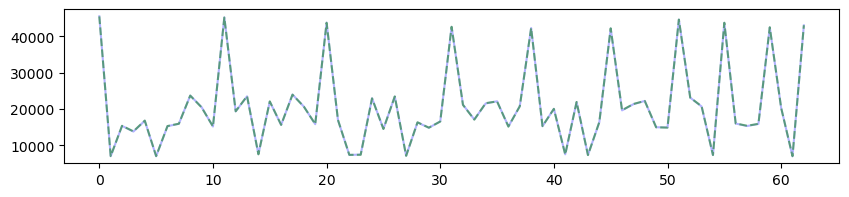

In [95]:
plt.figure(figsize=[10,2])
plt.plot(np.array(Y[-63:]), 'b', alpha=0.3)
plt.plot(y_pred[-63:], '--g', alpha=0.5)

In [96]:
# Initialize and train the LinearRegression model
# model = LinearRegression()
# 필요한 라이브러리 가져오기
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
model = RandomForestRegressor()
param_grid = {
    'n_estimators': [50, 100, 200],           # 트리의 개수
    'max_depth': [None, 10, 20, 30],          # 트리의 최대 깊이
    'min_samples_split': [2, 5, 10],         # 노드를 분할하는 최소 샘플 수
    'min_samples_leaf': [1, 2, 4],           # 리프 노드에 필요한 최소 샘플 수
    'max_features': ['sqrt']  # 각 분할에서 고려할 최대 특성 개수
}


grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=0)

grid_search.fit(X, Y)

# 최적의 하이퍼파라미터 조합 출력
best_params = grid_search.best_params_
print("최적 하이퍼파라미터:", best_params)

# 최적 모델 선택
best_model = grid_search.best_estimator_

# 최적 모델로 예측
y_pred = best_model.predict(X)

/home/jy/anaconda3/envs/smartfarm2/lib/python3.10/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/home/jy/anaconda3/envs/smartfarm2/lib/python3.10/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/home/jy/anaconda3/envs/smartfarm2/lib/python3.10/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/home/jy/anaconda3/envs/smartfarm2/lib/python3.10/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was pa

최적 하이퍼파라미터: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}


In [112]:
best_params

{'colsample_bytree': 0.8,
 'gamma': 0,
 'learning_rate': 0.01,
 'max_depth': 5,
 'min_child_weight': 1,
 'n_estimators': 1000,
 'subsample': 0.9}

In [97]:
best_params

{'max_depth': 10,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 200}

In [99]:
# RF 모델 생성
model = RandomForestRegressor(**best_params)

# 모델을 데이터에 맞춰 학습시킵니다. X는 입력 특성 데이터, Y는 타겟 데이터여야 합니다.
model.fit(X, Y)

# 모델이 학습되면, 예측을 수행할 수 있습니다.
y_pred = model.predict(X)

### Randomforest rslt

In [100]:
# Calculate RMSE between the predictions and actual 'y' values
def calculate_rmse(targets, predictions):
    from sklearn.metrics import mean_squared_error
    return np.sqrt(mean_squared_error(targets, predictions))



# Calculate r2_score between the predictions and actual 'y' values
def calculate_R2_score(y_test,y_pred):
    from sklearn.metrics import r2_score
    return r2_score(y_test, y_pred)

rmse = calculate_rmse(Y, y_pred)
r2score = calculate_R2_score(Y, y_pred)

### OUTPUT ###
print("RMSE:", rmse)
print("R2_score:", r2score)

RMSE: 263.0981977564214
R2_score: 0.9993723751449884


In [103]:
# param_grid = {
#     'n_estimators': [50, 100, 200],           # 트리의 개수
#     'max_depth': [None, 10, 20, 30],          # 트리의 최대 깊이
#     'min_samples_split': [2, 5, 10],         # 노드를 분할하는 최소 샘플 수
#     'min_samples_leaf': [1, 2, 4],           # 리프 노드에 필요한 최소 샘플 수
#     'max_features': ['sqrt']  # 각 분할에서 고려할 최대 특성 개수
# }

# # LGBMRegressor 모델 생성
# model = LGBMRegressor(**best_params)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=0)

# grid_search.fit(X, Y)

# # 최적의 하이퍼파라미터 조합 출력
# best_params = grid_search.best_params_
# print("최적 하이퍼파라미터:", best_params)

# # 최적 모델 선택
# best_model = grid_search.best_estimator_

# # 최적 모델로 예측
# y_pred = best_model.predict(X)

In [145]:
import lightgbm as lgb
from lightgbm import LGBMRegressor

# 주어진 하이퍼파라미터
best_params = {'max_depth': None,
             'max_features': 'sqrt',
             'min_samples_leaf': 4,
             'min_samples_split': 2,
             'n_estimators': 200}

# LGBMRegressor 모델 생성
model = LGBMRegressor(**best_params)

# 모델을 데이터에 맞춰 학습시킵니다. X는 입력 특성 데이터, Y는 타겟 데이터여야 합니다.
model.fit(X_train, y_train)

# 모델이 학습되면, 예측을 수행할 수 있습니다.
y_pred = model.predict(X_test)

[LightGBM] [Warning] min_data_in_leaf is set with min_samples_leaf=4, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] Unknown parameter: max_features


 코드에서는 최적의 하이퍼파라미터 조합을 `best_params` 에 정의하고, XGBoost 모델을 해당 조합으로 생성하여 학습시킵니다. 그런 다음, 최적의 모델을 사용하여 예측을 수행하고 성능을 평가합니다. 이렇게 하면 그리드 서치로 찾은 최적의 하이퍼파라미터를 적용한 XGBoost 모델을 얻었음.

식물성장에 영향을 주는 요인, 광투과율, 온도, 최적화 / 강화 -> 제어하는 알고리즘 짜면 좋을 것 같음?

### LGBM rslt

In [147]:
# Calculate RMSE between the predictions and actual 'y' values
def calculate_rmse(targets, predictions):
    from sklearn.metrics import mean_squared_error
    return np.sqrt(mean_squared_error(targets, predictions))



# Calculate r2_score between the predictions and actual 'y' values
def calculate_R2_score(y_test,y_pred):
    from sklearn.metrics import r2_score
    return r2_score(y_test, y_pred)

rmse = calculate_rmse(y_test, y_pred)
r2score = calculate_R2_score(y_test, y_pred)

### OUTPUT ###
print("RMSE:", rmse)
print("R2_score:", r2score)

RMSE: 719.0078368446215
R2_score: 0.9926714777818433


In [36]:
# base + lgbm
# RMSE: 5.579184255381722
# R2_score: 0.9999997177682968